# CHAPTER 4
## WQD7002 (P2) 
## WQD170031

## Steps thought of, will need to write them in for chapter 3 of the full report.
<br>1. data understanding - to identify fields important to the analysis (data accuracy etc.)
<br>2. text preprocessing - first remove common word (use nltk?); then perform 1 hot encoding (depending on how data need to be preprocessed to use the association rule library)???
<br>3. market basket analysis - association rule analysis - use pre-written libraries or copy from the coder who wrote his own algo for association rule analysis?
<br>4. evaluation by benchmarking to other metrics - see if high lift or support correspond to high number of lenders lending for the loan (or high amount raised in the crowdfunding) (or lesser time taken to raise the loan)

In [0]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [1]:
#try see if the code above stays the same next session
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!ls '/content/drive/My Drive/kiva data/from build.kiva.org/'

avy_name_lemma_basket.csv	   loans_2009.csv  loans.csv
avy_name_lemma_wordfreq.xlsx	   loans_2010.csv  loans_lenders.csv
avy_name_ps_wordfreq.xlsx	   loans_2011.csv  loans_othyr.csv
avy_name_wordfreq.xls		   loans_2012.csv  loans_v2.csv
crosstab_currency_countryname.xls  loans_2013.csv  loan_use_lemma_wordfreq.xlsx
crosstab_n_borrowers.xls	   loans_2014.csv  loan_use_ps_wordfreq.xlsx
dataset_overview_201119.xls	   loans_2015.csv  loan_use_wordfreq.xlsx
dataset_overview.xlsx		   loans_2016.csv  tags_lemma_wordfreq.xlsx
desc_wordcount.csv		   loans_2017.csv  tags_ps_wordfreq.xlsx
lenders.csv			   loans_2018.csv  wordcount_freq.csv


In [0]:
my_folder = '/content/drive/My Drive/kiva data/from build.kiva.org/'

In [0]:
import pandas as pd
import numpy as np

In [0]:
import pandas as pd
import numpy as np

df=pd.read_csv(my_folder+'loans_v2.csv')

df[['POSTED_TIME','PLANNED_EXPIRATION_TIME','DISBURSE_TIME','RAISED_TIME','REPORT_DT']] = \
df[['POSTED_TIME','PLANNED_EXPIRATION_TIME','DISBURSE_TIME','RAISED_TIME','REPORT_DT']].apply(pd.to_datetime)

df[df.select_dtypes(include=['int']).columns]=df[df.select_dtypes(include=['int']).columns].apply(pd.to_numeric,downcast='unsigned')

df[df.select_dtypes(include=['float']).columns]=df[df.select_dtypes(include=['float']).columns].apply(pd.to_numeric,downcast='float')

df[['ORIGINAL_LANGUAGE','STATUS','ACTIVITY_NAME','SECTOR_NAME','COUNTRY_CODE','COUNTRY_NAME','CURRENCY_POLICY','CURRENCY','REPAYMENT_INTERVAL','DISTRIBUTION_MODEL']]=\
df[['ORIGINAL_LANGUAGE','STATUS','ACTIVITY_NAME','SECTOR_NAME','COUNTRY_CODE','COUNTRY_NAME','CURRENCY_POLICY','CURRENCY','REPAYMENT_INTERVAL','DISTRIBUTION_MODEL']].astype('category')

In [0]:
df.info()

In [0]:
import dask.dataframe as dd
df2=dd.read_csv(my_folder+'loans_v2.csv')

## Load dataset

### study how can further reduce the amount of data used when defining the pandas dataframe, 
<br>also to make the analysis easier to read when using certain functions like describe etc.
<br>for 2nd part, consider reading https://www.dataquest.io/blog/pandas-big-data/

In [0]:
import pandas as pd
import numpy as np

In [0]:
#first six rows of data is not part of data so skip it
#df=pd.read_csv('E:/New folder/Google Drive/isha.salleh - backup and sync/kiva data/from build.kiva.org/loans.csv',encoding='ISO-8859-1', skiprows=6)
df=pd.read_csv('/content/drive/My Drive/kiva data/from build.kiva.org/loans.csv',\
               encoding='ISO-8859-1', skiprows=6)

In [0]:
df.info()

Since the code above cause a lot of RAM to be used, we try to change the format of the columns first o reduce RAM usage so that more can be used for calculation afterwards.
<br>This is done in the next 5 cells.

In [0]:
#generate table to determine what is inside the df
#might wanna put this in a definition so that can call it again and again
tmp=df.isnull().sum().reset_index(name='n_miss').rename({'index':'variable'},axis=1) #calculate number of missing values
tmp2=df.notnull().sum().reset_index(name='n_notmiss').rename({'index':'variable'},axis=1) #calculate number of non-missing values, https://stackoverflow.com/questions/47044183/count-non-null-values-in-pandas
tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable') #join the tables so that can recycle variable name
tmp['n']=tmp['n_miss']+tmp['n_notmiss']
tmp2=df.nunique().reset_index(name='n_unique').rename({'index':'variable'},axis=1) #calculate number of unique values
tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
tmp['miss_rate']=tmp['n_miss']/tmp['n']
tmp['fill_rate']=tmp['n_notmiss']/tmp['n']
tmp['distinct_rate']=tmp['n_unique']/tmp['n']
tmp2=df.dtypes.reset_index(name='vartype').rename({'index':'variable'},axis=1) #get variable type
tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
#tmp.to_excel(my_folder+'dataset_overview_201119.xls')
tmp

,variable,n_miss,n_notmiss,n,n_unique,miss_rate,fill_rate,distinct_rate,vartype
0,LOAN_ID,0,1682790,1682790,1682790,0.000000,1.000000,1.000000,uint32
1,LOAN_NAME,48555,1634235,1682790,393776,0.028854,0.971146,0.234002,object
2,ORIGINAL_LANGUAGE,44209,1638581,1682790,8,0.026271,0.973729,0.000005,category
3,DESCRIPTION,44244,1638546,1682790,1634630,0.026292,0.973708,0.971381,object
4,DESCRIPTION_TRANSLATED,453635,1229155,1682790,1225355,0.269573,0.730427,0.728169,object
...,...,...,...,...,...,...,...,...,...
66,TAGS_CLEAN_PS_WORDCOUNT,0,1682790,1682790,79,0.000000,1.000000,0.000047,uint8
67,LOAN_USE_CLEAN_LM_WORDCOUNT,0,1682790,1682790,64,0.000000,1.000000,0.000038,uint8
68,LOAN_USE_CLEAN_PS_WORDCOUNT,0,1682790,1682790,64,0.000000,1.000000,0.000038,uint8
69,REPORT_DT,0,1682790,1682790,1531971,0.000000,1.000000,0.910376,"datetime64[ns, UTC]"


In [0]:
#store the processes above as a python function
def data_overview(data):
  tmp=data.isnull().sum().reset_index(name='n_miss').rename({'index':'variable'},axis=1) #calculate number of missing values
  tmp2=data.notnull().sum().reset_index(name='n_notmiss').rename({'index':'variable'},axis=1) #calculate number of non-missing values, https://stackoverflow.com/questions/47044183/count-non-null-values-in-pandas
  tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable') #join the tables so that can recycle variable name
  tmp['n']=tmp['n_miss']+tmp['n_notmiss']
  tmp2=data.nunique().reset_index(name='n_unique').rename({'index':'variable'},axis=1) #calculate number of unique values
  tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
  tmp['miss_rate']=tmp['n_miss']/tmp['n']
  tmp['fill_rate']=tmp['n_notmiss']/tmp['n']
  tmp['distinct_rate']=tmp['n_unique']/tmp['n']
  tmp2=data.dtypes.reset_index(name='vartype').rename({'index':'variable'},axis=1) #get variable type
  tmp=pd.merge(tmp,tmp2,how='left',left_on='variable',right_on='variable')
  #tmp.to_excel(my_folder+'dataset_overview.xls')
  return tmp

In [0]:
df.head()

## Charts to understand the datasets

### miscellaneous?
testing certain ideas i had, aka understanding of the dataset

In [0]:
import matplotlib.pyplot as plt

Text(0.5, 0, 'N_BORROWER')

Text(0, 0.5, 'N_BORROWER2')

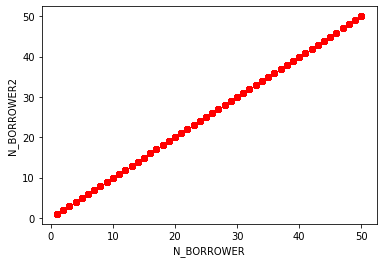

,N_BORROWER,N_BORROWER2
N_BORROWER,1.0,1.0
N_BORROWER2,1.0,1.0


In [0]:
#see number of borrowers same or not
#same

#by cross frequency tabulation
#pd.crosstab(df['N_BORROWER'],df['N_BORROWER2']).to_excel(my_folder+'crosstab_n_borrowers.xls')

#by plotting a chart displaying the two values - matplotlib chart
plt.scatter(df['N_BORROWERS'], df['N_BORROWERS2'], color='r')
plt.xlabel('N_BORROWERS')
plt.ylabel('N_BORROWERS2')
plt.show()

#by plotting a chart displaying the two values - plotly chart - too slow
#fig = px.scatter(df, x="N_BORROWER", y="N_BORROWER2")#,size='N_BORROWER', hover_data='N_BORROWER')
#fig.show()

#by calculating the correlation
df[['N_BORROWERS','N_BORROWERS2']].corr()

In [0]:
df2017=pd.read_csv(my_folder+'loans_2017.csv')
df2018=pd.read_csv(my_folder+'loans_2018.csv')

In [0]:
df[['FUNDED_AMOUNT','LOAN_AMOUNT']].corr()
df2017[['FUNDED_AMOUNT','LOAN_AMOUNT']].corr()
df2018[['FUNDED_AMOUNT','LOAN_AMOUNT']].corr()

,FUNDED_AMOUNT,LOAN_AMOUNT
FUNDED_AMOUNT,1.000000,0.954295
LOAN_AMOUNT,0.954295,1.000000


,FUNDED_AMOUNT,LOAN_AMOUNT
FUNDED_AMOUNT,1.000000,0.961327
LOAN_AMOUNT,0.961327,1.000000


,FUNDED_AMOUNT,LOAN_AMOUNT
FUNDED_AMOUNT,1.00000,0.93068
LOAN_AMOUNT,0.93068,1.00000


### functions defined for plotting charts

In [0]:
#create a function to generate the plotly horizontal bar chart for frequencies of categorical variables
#https://stackoverflow.com/questions/35692781/python-plotting-percentage-in-seaborn-bar-plot
 
import plotly.graph_objects as go
import seaborn as sns
import plotly.express as px

def interactive_freqchart_h(data,variable):
   
   #generate frequency dataset
   tmp=data[variable].value_counts(normalize=True).\
   reset_index(name='freq').rename(mapper={'index':variable},axis=1)#.\
   #pipe((sns.barplot, "data"), x='freq', y='ORIGINAL_LANGUAGE', palette='ch:.25')
   
   tmp['freq']=tmp['freq']*100
   #sns.barplot(y='ORIGINAL_LANGUAGE',x='freq',data=tmp,order=tmp['ORIGINAL_LANGUAGE'])

   fig = go.Figure(go.Bar(
       x=tmp['freq'],
       y=tmp[variable],
       orientation='h'))
   fig.update_layout(
       title="Distribution of " + variable,
       xaxis_title="Frequency (in %)",
       yaxis_title=variable)
   fig.show()
   #fig.show(config={'editable': True,'scrollZoom': True,'displayModeBar': True})
   #'modeBarButtonsToRemove': ['toggleSpikelines','hoverCompareCartesian']

In [0]:
import plotly.graph_objects as go

def interactive_freqchart_v(data,variable):
   
   #generate frequency dataset
   tmp=data[variable].value_counts(normalize=True).\
   reset_index(name='freq').rename(mapper={'index':variable},axis=1)
   
   tmp['freq']=tmp['freq']*100

   fig = go.Figure(go.Bar(
       x=tmp[variable],
       y=tmp['freq']))
   fig.update_layout(
       title="Distribution of " + variable,
       xaxis_title=variable,
       yaxis_title="Frequency (in %)")
   fig.show()
   #fig.show(config={'editable': True,'scrollZoom': True,'displayModeBar': True})
   #'modeBarButtonsToRemove': ['toggleSpikelines','hoverCompareCartesian']

In [0]:
#plan to use boxplots later, https://plot.ly/python/box-plots/
import plotly.express as px
tips = px.data.tips()
fig = px.box(tips, x="time", y="total_bill")
fig.show()

In [0]:
df.columns

Index(['LOAN_ID', 'LOAN_NAME', 'ORIGINAL_LANGUAGE', 'DESCRIPTION',
       'DESCRIPTION_TRANSLATED', 'FUNDED_AMOUNT', 'LOAN_AMOUNT', 'STATUS',
       'IMAGE_ID', 'VIDEO_ID', 'ACTIVITY_NAME', 'SECTOR_NAME', 'LOAN_USE',
       'COUNTRY_CODE', 'COUNTRY_NAME', 'TOWN_NAME', 'CURRENCY_POLICY',
       'CURRENCY_EXCHANGE_COVERAGE_RATE', 'CURRENCY', 'PARTNER_ID',
       'POSTED_TIME', 'PLANNED_EXPIRATION_TIME', 'DISBURSE_TIME',
       'RAISED_TIME', 'LENDER_TERM', 'NUM_LENDERS_TOTAL',
       'NUM_JOURNAL_ENTRIES', 'NUM_BULK_ENTRIES', 'TAGS', 'BORROWER_NAMES',
       'BORROWER_GENDERS', 'BORROWER_PICTURED', 'REPAYMENT_INTERVAL',
       'DISTRIBUTION_MODEL', 'DESC_TRANSLATED_WORDCOUNT', 'DESC_WORDCOUNT',
       'DESCRIPTION_NEW', 'DESC_NEW_WORDCOUNT', 'LOAN_USE_WORDCOUNT',
       'AVY_NAME_WORDCOUNT', 'N_DESC_TRANSLATED', 'N_DESC', 'N_DESC_NEW',
       'N_BORROWERS', 'N_BORROWERS2', 'GROUP_LOANS', 'N_F_BORROWERS',
       'N_M_BORROWERS', 'HAVE_PICTURE', 'HAVE_VIDEO', 'N_BORROWERS_PICTURED',
      

### numeric variables

In [0]:
#fig=px.box(df2017[df2017['FUNDED_AMOUNT']<=2000], x='STATUS', y = 'FUNDED_AMOUNT')
fig=px.box(df[(df['FUNDED_AMOUNT']<=3000) & (df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x='STATUS', y = 'FUNDED_AMOUNT', color="POSTED_YEAR")
fig.update_layout(legend_orientation="h")
#fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [0]:
fig=px.box(df[(df['LOAN_AMOUNT']<=3000) & (df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x='STATUS', y = 'LOAN_AMOUNT', color="POSTED_YEAR")
fig.update_layout(legend_orientation="h")
#fig=px.box(df2018, x='STATUS', y = 'LOAN_AMOUNT')
#fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [0]:
fig=px.box(df[(df['D_RAISED_LOANED']>=-3000) & (df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x='STATUS', y = 'D_RAISED_LOANED', color="POSTED_YEAR")
#fig=px.box(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
#           , x='STATUS', y = 'D_RAISED_LOANED', color="POSTED_YEAR")
fig.update_layout(legend_orientation="h")
#
#fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [0]:
#fig=px.box(df[(df['D_RAISED_LOANED']>=-3000) & (df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
#           , x='STATUS', y = 'D_RAISED_LOANED', color="POSTED_YEAR")
fig=px.box(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x='STATUS', y = 'N_DAYS_POSTED_RAISED', color="POSTED_YEAR")
fig.update_layout(legend_orientation="h")
#
#fig.show()

Output hidden; open in https://colab.research.google.com to view.

In [0]:
#fig=px.box(df[(df['D_RAISED_LOANED']>=-3000) & (df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
#           , x='STATUS', y = 'D_RAISED_LOANED', color="POSTED_YEAR")
fig=px.box(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x = 'SECTOR_NAME', y = 'N_DAYS_POSTED_RAISED', color = "POSTED_YEAR")
fig.update_layout(legend_orientation="h")

Output hidden; open in https://colab.research.google.com to view.

In [0]:
fig=px.box(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x = 'SECTOR_NAME', y = 'LOAN_AMOUNT')#, color = "STATUS")
fig.update_layout(legend_orientation="h")

Output hidden; open in https://colab.research.google.com to view.

In [0]:
#scatterplot between funded amount and loaned amount by status
fig = px.scatter(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)], \
                 x="LOAN_AMOUNT", y="FUNDED_AMOUNT", color="STATUS",size='NUM_LENDERS_TOTAL')
fig.show()

In [0]:
fig = px.scatter(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)],\
                 x="LOAN_AMOUNT", y="FUNDED_AMOUNT", color="STATUS",size='AVG_LOAN_PER_LENDER')
fig.show()

In [0]:
fig=px.box(df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
           , x = 'SECTOR_NAME', y = 'N_DAYS_POSTED_RAISED', color = "STATUS")
fig.update_layout(legend_orientation="h")

Output hidden; open in https://colab.research.google.com to view.

In [0]:
interactive_freqchart_v(data=df,variable='NUM_LENDERS_TOTAL')

In [0]:
interactive_freqchart_v(data=df,variable='NUM_JOURNAL_ENTRIES')

In [0]:
interactive_freqchart_v(data=df,variable='NUM_BULK_ENTRIES')

### categorical variables

In [0]:
#DIFFERENT LANGUAGES USED IN THE DESCRIPTION
interactive_freqchart_h(data=df,variable='ORIGINAL_LANGUAGE')

In [0]:
#plot status
interactive_freqchart_h(data=df[(df['POSTED_YEAR']>=2017) & (df['POSTED_YEAR']<2019)]\
                        ,variable='STATUS')

In [0]:
#plot status
interactive_freqchart_h(data=df,variable='ACTIVITY_NAME')

In [0]:
#plot sector names
interactive_freqchart_h(data=df,variable='SECTOR_NAME')

In [0]:
#plot country names
interactive_freqchart_h(data=df,variable='COUNTRY_NAME')

In [0]:
#plot CURRENCY POLICY
interactive_freqchart_h(data=df,variable='CURRENCY_POLICY')

In [0]:
#plot CURRENCY_EXCHANGE_COVERAGE_RATE
interactive_freqchart_h(data=df,variable='CURRENCY_EXCHANGE_COVERAGE_RATE')

In [0]:
pd.crosstab(df['CURRENCY'],df['COUNTRY_NAME']).to_excel(my_folder+'crosstab_currency_countryname.xls')
#ONLY 78 ROWS BUT 99 COLUMNS SO ALMOST SIMILAR...

In [0]:
#plot CURRENCY
interactive_freqchart_h(data=df,variable='CURRENCY')

#looks like the currency coincide with country, try to calculate the correlation?

In [0]:
#plot REPAYMENT_INTERVAL
interactive_freqchart_h(data=df,variable='REPAYMENT_INTERVAL')

In [0]:
#plot DISTRIBUTION_MODEL
interactive_freqchart_h(data=df,variable='DISTRIBUTION_MODEL')

### chart of additional fields created

In [0]:
interactive_freqchart_v(data=df,variable='POSTED_YEAR')

In [0]:
interactive_freqchart_h(data=df,variable='DESC_WORDCOUNT')

In [0]:
interactive_freqchart_v(data=df,variable='LOAN_USE_WORDCOUNT')

In [0]:
interactive_freqchart_v(data=df,variable='AVY_NAME_WORDCOUNT')

In [0]:
interactive_freqchart_h(data=df,variable='GROUP_LOANS')

In [0]:
interactive_freqchart_v(data=df,variable='N_TAGS')

In [0]:
interactive_freqchart_v(data=df,variable='N_BORROWERS')
interactive_freqchart_v(data=df,variable='N_F_BORROWERS')
interactive_freqchart_v(data=df,variable='N_M_BORROWERS')

In [0]:
interactive_freqchart_h(data=df,variable='HAVE_PICTURE')

In [0]:
interactive_freqchart_h(data=df,variable='HAVE_VIDEO')

In [0]:
interactive_freqchart_v(data=df,variable='N_BORROWERS_PICTURED')

In [0]:
interactive_freqchart_v(data=df,variable='D_RAISED_LOANED')

In [0]:
sns.distplot(df['D_RAISED_LOANED'])

In [0]:
interactive_freqchart_v(data=df,variable='N_MTH_POSTED_RAISED')
interactive_freqchart_v(data=df,variable='N_MTH_DISBURSED_POSTED')
interactive_freqchart_v(data=df,variable='N_MTH_DISBURSED_EXPIRE')
interactive_freqchart_v(data=df,variable='N_MTH_POSTED_EXPIRE')

In [0]:
interactive_freqchart_v(data=df, variable='AVY_NAME_CLEAN_LM_WORDCOUNT')
interactive_freqchart_v(data=df, variable='AVY_NAME_CLEAN_PS_WORDCOUNT')

In [0]:
interactive_freqchart_v(data=df, variable='LOAN_USE_CLEAN_LM_WORDCOUNT')
interactive_freqchart_v(data=df, variable='LOAN_USE_CLEAN_PS_WORDCOUNT')

In [0]:
interactive_freqchart_v(data=df, variable='TAGS_CLEAN_LM_WORDCOUNT')
interactive_freqchart_v(data=df, variable='TAGS_CLEAN_PS_WORDCOUNT')

In [0]:
#understanding the time frame in the data downloaded
#suspect that RAISED_TIME is time when a loan is fully funded by Kiva lenders on Kiva
#if this is true, then the dates should always be later than POSTED_TIME, which is time when a loan is posted by FP for fundraising in Kiva.
#suspect that PLANNED_EXPIRATION_TIME is the time allocated/targeted to raise the fund
#compare POSTED_TIME and DISBURSED_TIME as a way to check which loans have been disbursed first from FP to borrower 
#compare PLANNED_EXPIRATION_TIME and DISBURSED_TIME, and PLANNED_EXPIRATION_TIME and POSTED_TIME 
##to verify whether PLANNED_EXPIRATION_TIME is same as LENDER_TERM or different

In [0]:
interactive_freqchart_v(data=df, variable = 'N_MTH_POSTED_RAISED')
interactive_freqchart_v(data=df, variable='N_DAYS_POSTED_RAISED')

In [0]:
df[df.select_dtypes(include=['datetimetz']).columns].describe().T

,count,unique,top,freq,first,last
POSTED_TIME,1682790,1676798,2006-04-16 07:10:50+00:00,207,2006-04-16 07:10:50+00:00,2019-02-25 04:12:27+00:00
PLANNED_EXPIRATION_TIME,1310956,666807,2018-07-20 05:35:37+00:00,28,2012-01-30 08:01:57+00:00,2019-04-28 03:30:05+00:00
DISBURSE_TIME,1679601,77068,2018-11-30 08:00:00+00:00,3126,2005-04-14 05:27:55+00:00,2019-05-01 07:00:00+00:00
RAISED_TIME,1597640,1332680,2005-03-31 06:27:55+00:00,203,2005-03-31 06:27:55+00:00,2019-02-27 08:22:16+00:00


## run the code below will need very high RAM

In [0]:
#from IPython.display import display, HTML
#RAM consuming so cannot use this, try explore an option from nltk, or remove stopwords first
df.DESCRIPTION_TRANSLATED.str.split(expand=True).stack().value_counts().to_frame().reset_index()#.\
#to_csv('/content/drive/My Drive/kiva data/check description field from loans file.csv')
#HTML(df3Desc.to_html())

In [0]:
#MAY WANT TO CONSIDER THE FOLLOWING TOO:borrower_pictured,borrower_genders, town_name
df[['STATUS','ACTIVITY_NAME','SECTOR_NAME','COUNTRY_NAME']]=\
df[['STATUS','ACTIVITY_NAME','SECTOR_NAME','COUNTRY_NAME']].astype('category')